In [2]:
%pylab inline
import pandas as pd

Populating the interactive namespace from numpy and matplotlib


## Gradient Descent.

Para entender el funcionamiento de un modelo de ML, empecemos por un problema simple.

In [3]:
dic = {'X':[i for i in range (6)], 'Y':[i for i in range (6)]}
data = pd.DataFrame(dic)
data

,X,Y
0,0,0
1,1,1
2,2,2
3,3,3
4,4,4
5,5,5


Para los datos anteriores, queremos construir un modelo, llamado **hipótesis**, que depende de cierto conjunto de parámetros $\theta=(\theta_0,\theta_1,\cdots,\theta_k)$ y de las **características** $X$; de modo que la **función de coste** $J$ definida como

$$J[\theta] = \frac{1}{2m}\sum_{i}^{m}\left( h[\theta,X]-Y \right)^2$$

alcanza su valor mínimo para los valores $\theta$ adecuados.

Nuestro objetivo es obtener estos **valores óptimos** para una hipótesis lineal: $h(\theta) = \theta_0 + \theta_1 X$

In [4]:
def CostFunct1(θ0, θ1):
    m = len(data.Y)
    J = 1/(2*m)*np.dot( 
        (θ0 + θ1*data.X) - data.Y, (θ0 + θ1*data.X) - data.Y
    )
    return J

CostFunct=np.vectorize(CostFunct1)

### Caso 1D.

Supongamos en primer lugar que $\theta_0 = 0$:

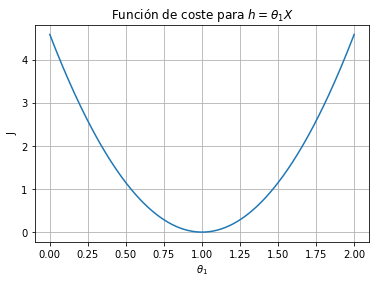

In [5]:
θ0 = 0.0
θ1 = np.linspace(0.0,2.0,300)

costF = np.array([ CostFunct(θ0, θ) for θ in θ1])

plt.plot(θ1, costF)
plt.title(r'Función de coste para $h=\theta_1 X$')
plt.xlabel(r'$\theta_1$')
plt.ylabel('J')
plt.grid()

In [6]:
minCost = θ1[costF==min(costF)][0]
print("El mínimo de la función de coste es theta1={:.6}".format(minCost))

El mínimo de la función de coste es theta1=0.996656


Con este valor mínimo encontrado para $J$, vemos que el ajuste de los datos a la hipótesis es correcto.

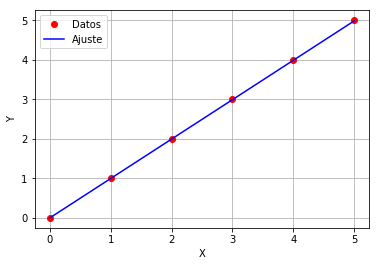

In [7]:
x = np.linspace(0,5)
plt.plot(data.X, data.Y, 'ro', label='Datos')
plt.plot(x, minCost*x, 'b', label='Ajuste')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.legend()

### Caso 2D.

Si ahora permitimos que $\theta_0$ también varíe.

In [8]:
θ0 = np.linspace(-1.0,1.0,300)

θ0v, θ1v = np.meshgrid(θ0, θ1)
CostF2d = CostFunct(θ0v, θ1v)

In [ ]:
!pip install plotly

In [11]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Surface(z=CostF2d, x=θ0v, y=θ1v)])
fig.update_layout(title='FUnción de Coste ajuste lineal 2D.', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90),
                  scene = dict(
                    xaxis_title=r'$\theta_0$',
                    yaxis_title=r'$\theta_1$',
                    zaxis_title='J')
                  )
fig.show()

Una expresión anlítica para la función de coste es fácilmente derivable:

$$J = \frac{1}{2m}\sum_{i}^{m}\left[ \theta_1 X_i - \theta_0 - Y_i \right]^2 \qquad, \text{ en este caso } Y_i=X_i$$
$$J = \frac{1}{2m}\sum_{i}^{m}\left[ \theta_1 X_i - \theta_0 - X_i \right]^2$$
$$J = \frac{1}{2m}\sum_{i}^{m}\left[ (\theta_1 - 1 )X_i - \theta_0 \right]^2$$
$$J = \frac{1}{2m}\sum_{i}^{m}\left[ (\theta_1 - 1 )^2X_i^2 + \theta_0^2 - 2\theta_0(\theta_1-1)X_i\right]^2$$
$$J = \left[ (\theta_1 - 1 )^2\frac{1}{2m}\sum_{i}^{m}X_i^2 + \theta_0^2\frac{1}{2m}\sum_{i}^{m} - 2\theta_0(\theta_1-1)\frac{1}{2m}\sum_{i}^{m}X_i\right]$$

De manera resumida

$$J = (\theta_1 - 1 )^2 A + \theta_0^2 B - 2\theta_0(\theta_1-1)C$$

El caso 1D es para $\theta_0=0$:

$$J^{(1D)}=(\theta_1 - 1 )^2 A$$

## Generalización.

Ahora que se tiene intuición sobre el proceso, pasamos al caso general.

### Ejemplo 1: $(x-4)^2$

In [81]:
import sympy as sym
from sympy.utilities.lambdify import lambdify, implemented_function
from sympy.tensor.array import derive_by_array

In [18]:
def quadratic1(x):
    return (x-4)**2

def dQuad(x):
    return 2*x-8

In [119]:
def GD1D(f, df, guess, α, Tol):
    
    ω0 = guess
    ω1 = guess - α*df(guess)
    ω = [ω0, ω1]
    
    idx = 1

    while(np.abs( f(ω[idx])-f(ω[idx-1]) ) > Tol):
        #print(np.abs( ω[idx]-ω[idx-1] ))
        ω.append( ω[idx] - α*df( ω[idx] ) )
        idx += 1
    
    return ω

In [121]:
guess = 6
α = [0.5, 0.1, 0.05]
Tol = 1e-4

for lr in α:
    minQuad = GD1D(quadratic1, dQuad, guess, lr, Tol)
    print('El mínimo de la función es x = {}, para alpha = {}'.format(minQuad[-1:][0], lr))

El mínimo de la función es x = 4.0, para alpha = 0.5
El mínimo de la función es x = 4.011805916207174, para alpha = 0.1
El mínimo de la función es x = 4.0193954745957505, para alpha = 0.05


### Ejemplo 2: $F(x,y)=\sin(0.5x^2-0.25y^2+3)\cos(2x+1-\exp(y))$

In [89]:
def F(x, y):
    return np.sin(0.5*x**2-0.25*y**2+3)*np.cos(2*x+1-np.exp(y))    

def dF(x, y):
    symF = sym.sympify('sin(0.5*x**2-0.25*y**2+3)*cos(2*x+1-exp(y))')
    symGrad = derive_by_array(sF, (sym.Symbol('x'), sym.Symbol('y')))
    gradF =  lambdify( (sym.Symbol('x'), sym.Symbol('y')), symGrad)
    return gradF(x, y)

Primero podemos observar la gráfica de la función.

In [134]:
xF = np.linspace(-2.5, 2.5, 100)
yF = np.linspace(-2.5, 2.5, 100)

xFv, yFv = np.meshgrid(xF, yF)
Funct = F(xFv, yFv)

fig = go.Figure(data=[go.Surface(z=Funct, x=xFv, y=yFv)])
fig.update_layout(title='Función 3D.', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90),
                  scene = dict(
                    xaxis_title=r'x',
                    yaxis_title=r'y',
                    zaxis_title='F(x,y)')
                  )
fig.show()

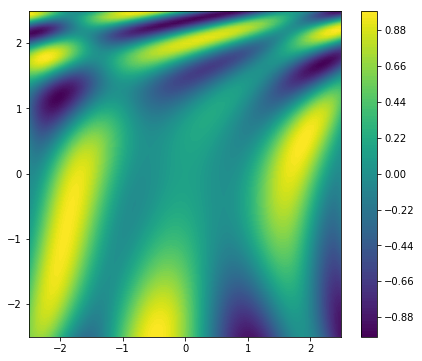

In [152]:
figure(figsize=(7,6))
plt.contourf(xFv, yFv, Funct, 100)
plt.colorbar()

In [125]:
def GD2D(f, df, guess, α, Tol):
    
    ω0 = guess
    ω1 = guess - α*np.array(df(*guess))
    ω = [ω0, ω1]
    
    idx = 1

    while(np.abs( np.dot(ω[idx]-ω[idx-1], ω[idx]-ω[idx-1]) ) > Tol):
        #print(np.abs( ω[idx]-ω[idx-1] ))
        ω.append( ω[idx] - α*np.array(df( *ω[idx] ) ))
        idx += 1

    
    return ω

In [163]:
guess2 = [0.5, 0.5]
α2 = 0.1
minF = GD2D(F, dF, guess2, α2, Tol)

In [164]:
print('El mínimo de la función está en x = {}, y = {}'.format(*minF[-1:][0]))

El mínimo de la función está en x = 2.1850761413079733, y = 1.6792621978854905


Podemos seguir la trayectoria del punto inicial hacia el mínimo en el gráfico de contorno.

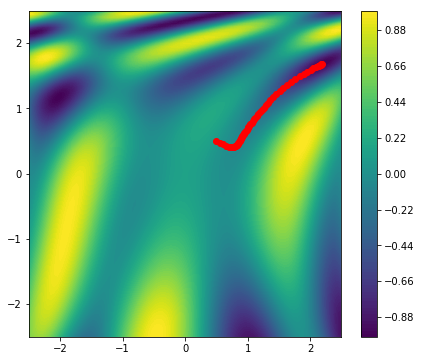

In [165]:
figure(figsize=(7,6))
plt.contourf(xFv, yFv, Funct, 100)
plt.colorbar()
for point in minF:
    plt.plot(point[0], point[1], 'ro')

Hay que notar que como la función posee varios mínimos locales dentro del dominio que escogimos, $(-2.5,2.5)$, la elección del punto inicial determina el punto mínimo que alcanza el algoritmo; por lo que **el resultado puede variar**, además de depender de la tasa de aprendizaje.

## Modelo de Machine Learning: solución general.

Ahora veamos cómo se aplica a un modelo de machine learning.

In [239]:
X_data = np.linspace(0, 1, 100)
y_data = 0.2 + 0.2*X_data + 0.02*np.random.random(100)

Para estos datos un ajuste lineal debería arrojar un buen resultado, por lo tanto esogemos como hipótesis

$$h(X, \Theta) = \theta_0+\theta_1 X$$

y función de costo

$$J = \frac{1}{2m}\sum_{i}^{m}[\theta_0+\theta_1 X^{(i)} - y^{(i)}]^2$$

Si $\Theta^T=\pmatrix{\theta_0 & \theta_1}$ esta función de costo se puede reescribir como

$$J = \frac{1}{2m}(\Theta^T \tilde{X}-y)^2$$

donde

$$\tilde{X} = \pmatrix{1 & 1 & \cdots & 1 \\ x^{(1)} & x^{(2)} & \cdots & x^{(m)}}$$

In [248]:
def GD2Dv2(f, df, guess, α, epochs):
    
    ω0 = guess
    ω1 = guess - α*np.array(df(*guess))
    ω = [ω0, ω1]
    
    for i in range(1, epochs):
        ω.append( ω[i] - α*np.array(df( *ω[i] ) ))

    return ω

In [249]:
def J(θ0, θ1):
    Θ = [θ0, θ1]
    m = len(X_data)
    X_til = np.matrix([np.ones(m), X_data])
    J = 1/(2*m)*np.dot(Θ@X_til-y_data, Θ@X_til-y_data)
    return J

def dJ(θ0, θ1):
    Θ = [θ0, θ1]
    m = len(X_data)
    X_til = np.matrix([np.ones(m), X_data])
    dJdt0 =  (Θ@X_til-y_data).mean()
    dJdt1 = 1/m*np.dot(Θ@X_til-y_data, X_data.T)
    
    return [dJdt0, dJdt1]

In [250]:
guessJ = [1.5, 1.5]
αJ = 0.5
fitParams = GD2Dv2(J, dJ, guessJ, αJ, 100)[-1:]

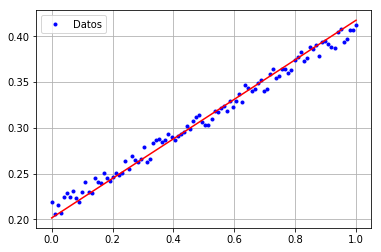

In [256]:
plt.plot(X_data, y_data, 'b.', label='Datos')
plt.plot(X_data, fitParams[0][0]+fitParams[0][1]*X_data, 'r', label='Ajuste por GD.')
plt.legend()
plt.grid()

In [257]:
from sklearn.linear_model import LinearRegression
LinearRegression(fit_intercept=True, copy_X=True)

model = LinearRegression().fit(X_data.reshape((-1, 1)), y_data)
intr = model.intercept_
slope = model.coef_

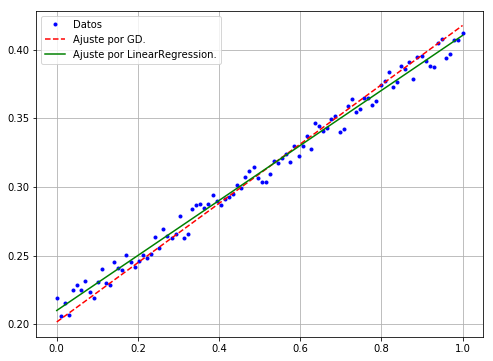

In [266]:
y_predGD = fitParams[0][0]+fitParams[0][1]*X_data
y_predLR = intr + slope*X_data

figure(figsize=(8,6))
plt.plot(X_data, y_data, 'b.', label='Datos')
plt.plot(X_data, y_predGD, 'r--', label='Ajuste por GD.')
plt.plot(X_data, y_predLR, 'g', label='Ajuste por LinearRegression.')
plt.legend()
plt.grid()

In [270]:
from sklearn.metrics import r2_score
print('El R^2 para la implementación de GD fue {:.6}\nEl R^2 para LinearRegression fue {:.6}'.format(
r2_score(y_data, y_predGD), model.score(X_data.reshape((-1, 1)), y_data)))

El R^2 para la implementación de GD fue 0.984478
El R^2 para LinearRegression fue 0.990587


Hay una **ligera mejora** usando *LinearRegression*, sin embargo, el resultado mediante el *Gradient Descent* que se implementó, es bastante **adecuado** según el *score*.